Build a predictive model to determine the Grade of house (The grades are A,B,C,D, and E)


In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv("House Grade.csv")
df

,Id,Area(total),Trooms,Nbedrooms,Nbwashrooms,Twashrooms,roof,Roof(Area),Lawn(Area),Nfloors,API,ANB,Expected price,Grade
0,1,339,6,5,4,6,NO,0,76,2,79,6,3481,D
1,2,358,5,4,3,4,YES,71,96,3,72,4,3510,D
2,3,324,7,5,4,5,YES,101,117,5,64,3,3748,C
3,4,330,6,4,3,5,YES,101,82,2,59,2,3134,D
4,5,320,7,4,4,5,NO,0,75,3,40,1,3843,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,2996,341,9,6,5,7,YES,95,115,5,90,2,4246,B
2996,2997,292,9,8,7,8,YES,116,87,7,97,4,3753,A
2997,2998,328,7,4,3,5,NO,0,78,5,95,6,3607,D
2998,2999,293,9,7,7,8,NO,0,78,7,51,3,4198,B


In [3]:
df.drop('Id',axis='columns',inplace=True)

In [4]:
df.shape

(3000, 13)

In [5]:
df.head(3)

,Area(total),Trooms,Nbedrooms,Nbwashrooms,Twashrooms,roof,Roof(Area),Lawn(Area),Nfloors,API,ANB,Expected price,Grade
0,339,6,5,4,6,NO,0,76,2,79,6,3481,D
1,358,5,4,3,4,YES,71,96,3,72,4,3510,D
2,324,7,5,4,5,YES,101,117,5,64,3,3748,C


In [6]:
df.tail(3)

,Area(total),Trooms,Nbedrooms,Nbwashrooms,Twashrooms,roof,Roof(Area),Lawn(Area),Nfloors,API,ANB,Expected price,Grade
2997,328,7,4,3,5,NO,0,78,5,95,6,3607,D
2998,293,9,7,7,8,NO,0,78,7,51,3,4198,B
2999,343,7,6,6,8,NO,0,108,5,95,3,4105,C


In [7]:
df.columns

Index(['Area(total)', 'Trooms', 'Nbedrooms', 'Nbwashrooms', 'Twashrooms',
       'roof', 'Roof(Area)', 'Lawn(Area)', 'Nfloors', 'API', 'ANB',
       'Expected price', 'Grade'],
      dtype='object')

In [8]:
df.dtypes

Area(total)        int64
Trooms             int64
Nbedrooms          int64
Nbwashrooms        int64
Twashrooms         int64
roof              object
Roof(Area)         int64
Lawn(Area)         int64
Nfloors            int64
API                int64
ANB                int64
Expected price     int64
Grade             object
dtype: object

In [9]:
df.describe()

,Area(total),Trooms,Nbedrooms,Nbwashrooms,Twashrooms,Roof(Area),Lawn(Area),Nfloors,API,ANB,Expected price
count,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.000000,3000.00000,3000.000000
mean,325.117000,7.021667,5.023000,4.513667,6.010667,48.980667,95.609333,4.013333,70.190667,3.47900,3782.938333
std,20.507742,1.421221,1.634838,1.715263,1.786136,48.746641,14.837388,1.621532,17.563460,1.69426,567.189995
min,290.000000,5.000000,2.000000,1.000000,2.000000,0.000000,70.000000,1.000000,40.000000,1.00000,2504.000000
25%,308.000000,6.000000,4.000000,3.000000,5.000000,0.000000,83.000000,3.000000,55.000000,2.00000,3354.000000
50%,325.000000,7.000000,5.000000,4.000000,6.000000,71.000000,96.000000,4.000000,70.000000,4.00000,3771.000000
75%,343.000000,8.000000,6.000000,6.000000,7.000000,96.000000,109.000000,5.000000,85.000000,5.00000,4208.000000
max,360.000000,9.000000,8.000000,8.000000,10.000000,120.000000,120.000000,7.000000,100.000000,6.00000,5216.000000


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Area(total)     3000 non-null   int64 
 1   Trooms          3000 non-null   int64 
 2   Nbedrooms       3000 non-null   int64 
 3   Nbwashrooms     3000 non-null   int64 
 4   Twashrooms      3000 non-null   int64 
 5   roof            3000 non-null   object
 6   Roof(Area)      3000 non-null   int64 
 7   Lawn(Area)      3000 non-null   int64 
 8   Nfloors         3000 non-null   int64 
 9   API             3000 non-null   int64 
 10  ANB             3000 non-null   int64 
 11  Expected price  3000 non-null   int64 
 12  Grade           3000 non-null   object
dtypes: int64(11), object(2)
memory usage: 304.8+ KB


In [11]:
df.isnull().sum()

Area(total)       0
Trooms            0
Nbedrooms         0
Nbwashrooms       0
Twashrooms        0
roof              0
Roof(Area)        0
Lawn(Area)        0
Nfloors           0
API               0
ANB               0
Expected price    0
Grade             0
dtype: int64

In [12]:
df.roof.value_counts()

YES    1543
NO     1457
Name: roof, dtype: int64

In [13]:
df.Grade.value_counts()

D    1270
C     716
B     539
A     399
E      76
Name: Grade, dtype: int64

# EDA

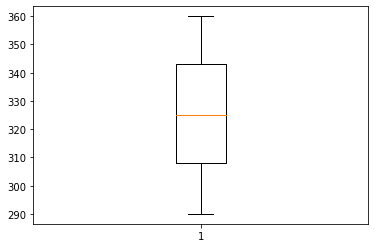

In [14]:
plt.boxplot(df["Area(total)"]);

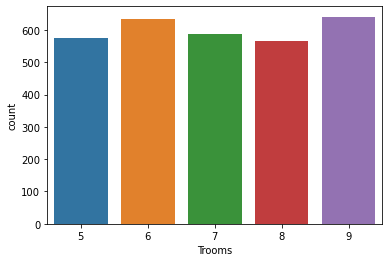

In [15]:
sns.countplot(df.Trooms);

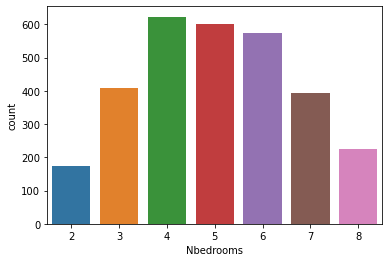

In [16]:
sns.countplot(df.Nbedrooms);

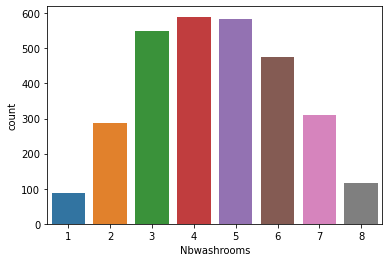

In [17]:
sns.countplot(df.Nbwashrooms);

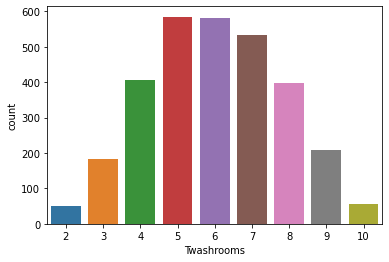

In [18]:
sns.countplot(df.Twashrooms);

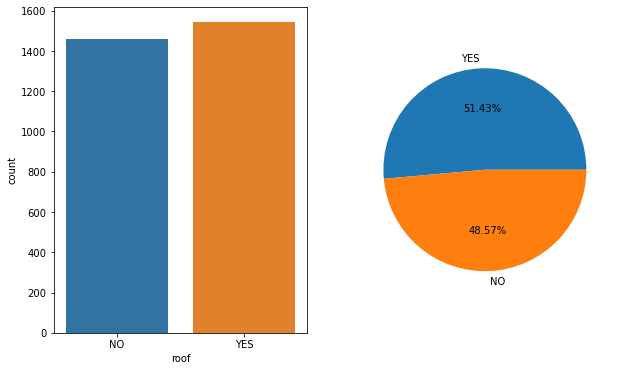

In [19]:
fig,ax=plt.subplots(1,2,figsize=(10,6))
sns.countplot(df.roof,ax=ax[0])
percentage=df.roof.value_counts()
labels=list(df.roof.value_counts().index)
plt.pie(percentage,labels=labels,autopct="%0.2f%%")
plt.show()

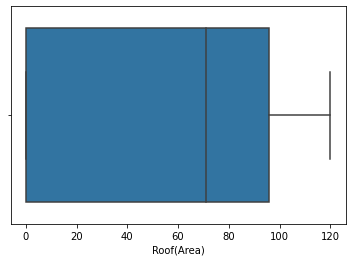

In [20]:
sns.boxplot(df["Roof(Area)"]);

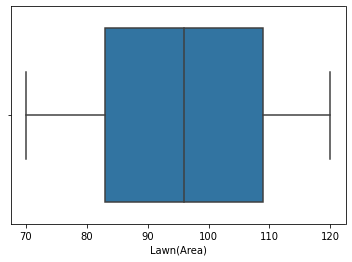

In [21]:
sns.boxplot(df["Lawn(Area)"]);

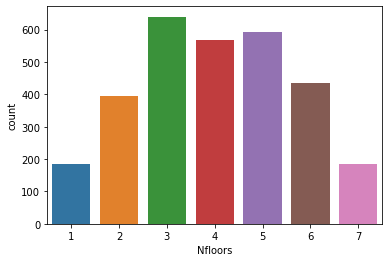

In [22]:
sns.countplot(df.Nfloors);

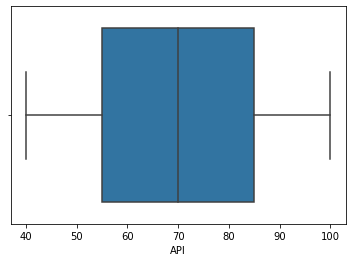

In [23]:
sns.boxplot(df["API"]);

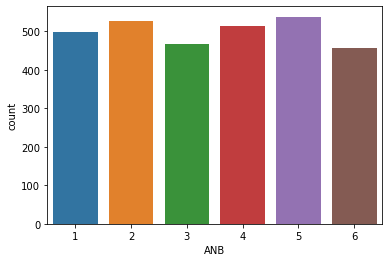

In [24]:
sns.countplot(df["ANB"]);

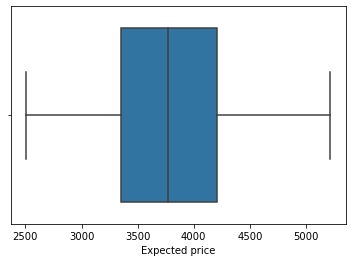

In [25]:
sns.boxplot(df["Expected price"]);

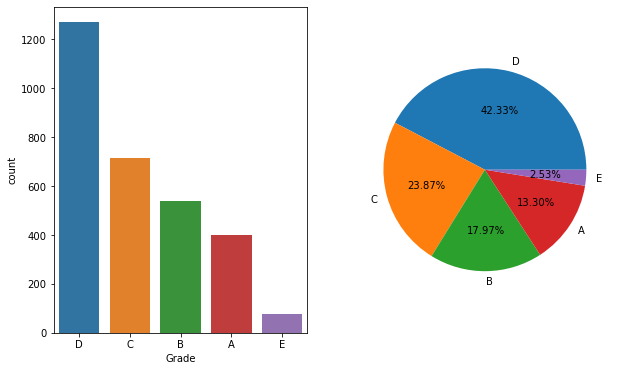

In [26]:
fig,ax=plt.subplots(1,2,figsize=(10,6))
sns.countplot(df.Grade,ax=ax[0])
percentage=df.Grade.value_counts()
labels=list(df.Grade.value_counts().index)
plt.pie(percentage,labels=labels,autopct="%0.2f%%")
plt.show()

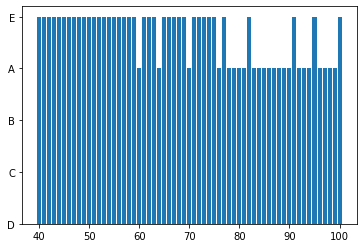

In [27]:
plt.bar(df["API"],df["Grade"]);

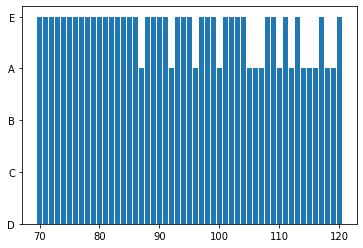

In [28]:
plt.bar(df["Lawn(Area)"],df["Grade"]);

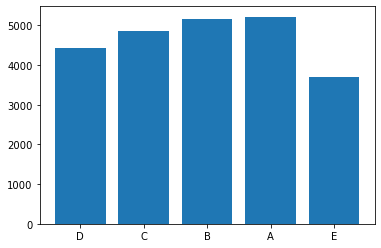

In [29]:
plt.bar(height=df["Expected price"],x=df["Grade"]);

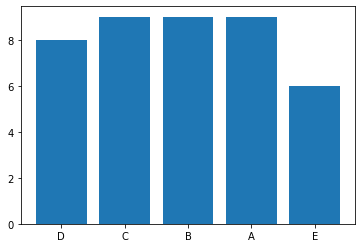

In [30]:
plt.bar(height=df["Trooms"],x=df["Grade"]);


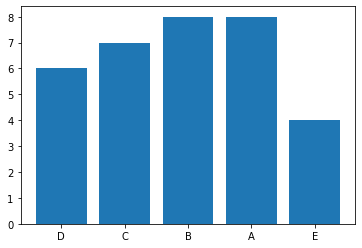

In [31]:
plt.bar(height=df["Nbedrooms"],x=df["Grade"]);

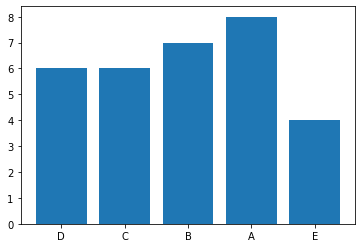

In [32]:
plt.bar(height=df["Nbwashrooms"],x=df["Grade"]);

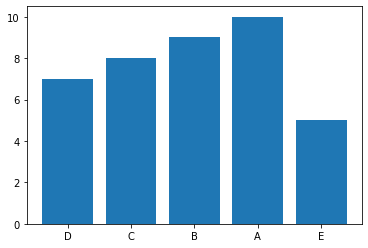

In [33]:
plt.bar(height=df["Twashrooms"],x=df["Grade"]);

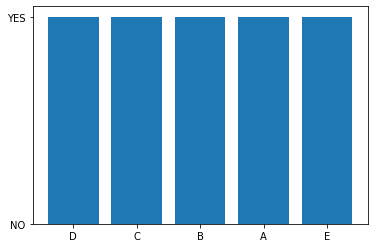

In [34]:
plt.bar(height=df["roof"],x=df["Grade"]);

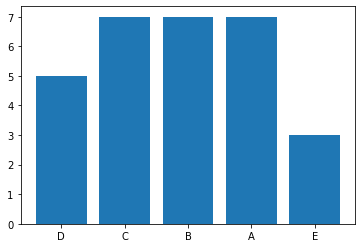

In [35]:
plt.bar(height=df["Nfloors"],x=df["Grade"]);

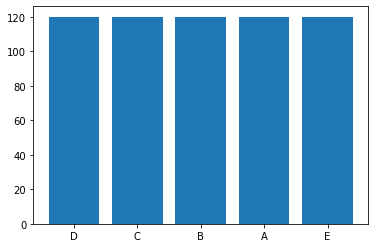

In [36]:
plt.bar(height=df["Lawn(Area)"],x=df["Grade"]);

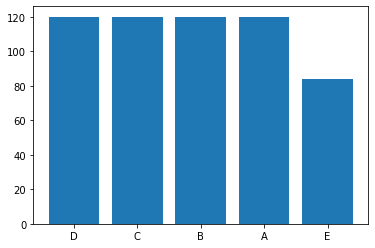

In [37]:
plt.bar(height=df["Roof(Area)"],x=df["Grade"]);

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
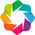

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [38]:
from autoviz.AutoViz_Class import AutoViz_Class

In [39]:
%matplotlib inline

In [40]:
AV=AutoViz_Class()

Shape of your Data Set loaded: (3000, 14)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
Data cleaning improvement suggestions. Complete them before proceeding to ML modeling.


,Nuniques,dtype,Nulls,Nullpercent,NuniquePercent,Value counts Min,Data cleaning improvement suggestions
Id,3000,int64,0,0.000000,100.000000,0,possible ID column: drop
Expected price,1647,int64,0,0.000000,54.900000,0,
Area(total),71,int64,0,0.000000,2.366667,0,
API,61,int64,0,0.000000,2.033333,0,
Roof(Area),52,int64,0,0.000000,1.733333,0,
Lawn(Area),51,int64,0,0.000000,1.700000,0,
Twashrooms,9,int64,0,0.000000,0.300000,0,
Nbwashrooms,8,int64,0,0.000000,0.266667,0,
Nbedrooms,7,int64,0,0.000000,0.233333,0,
Nfloors,7,int64,0,0.000000,0.233333,0,


    13 Predictors classified...
        1 variables removed since they were ID or low-information variables
        List of variables removed: ['Id']

################ Multi_Classification problem #####################


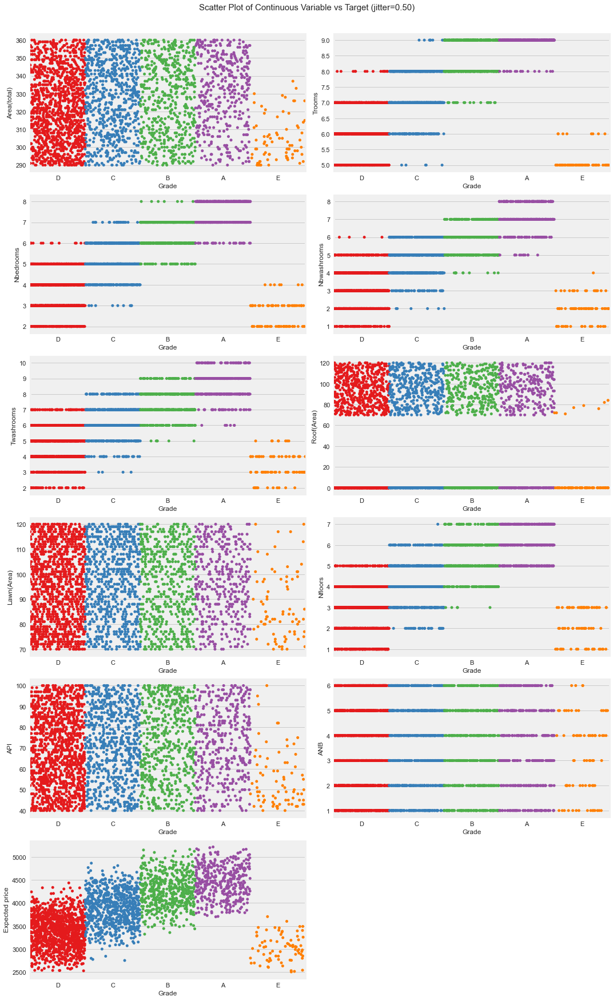

Total Number of Scatter Plots = 66


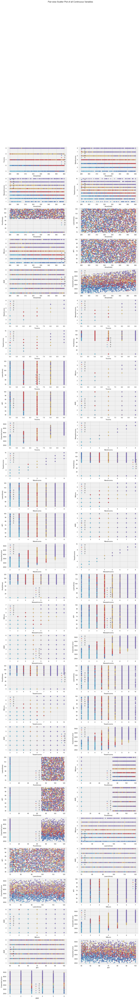

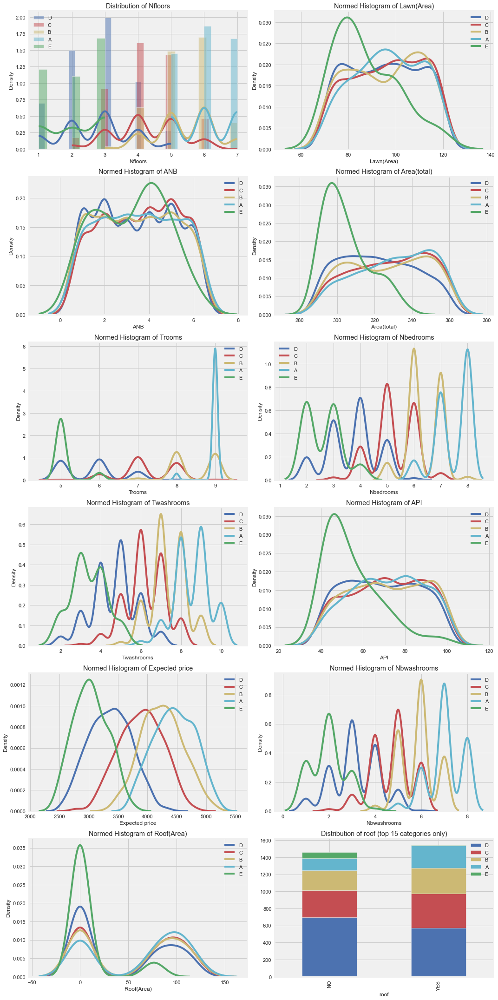

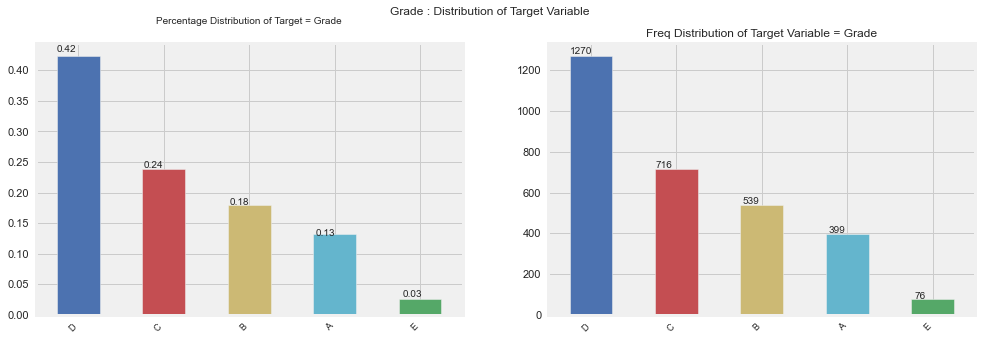

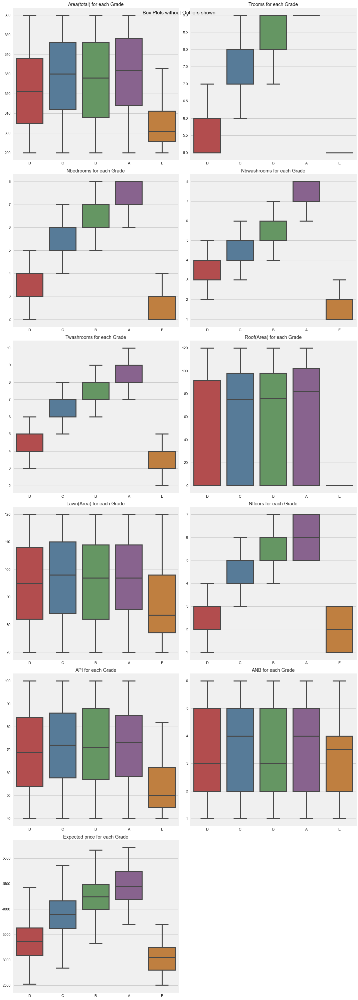

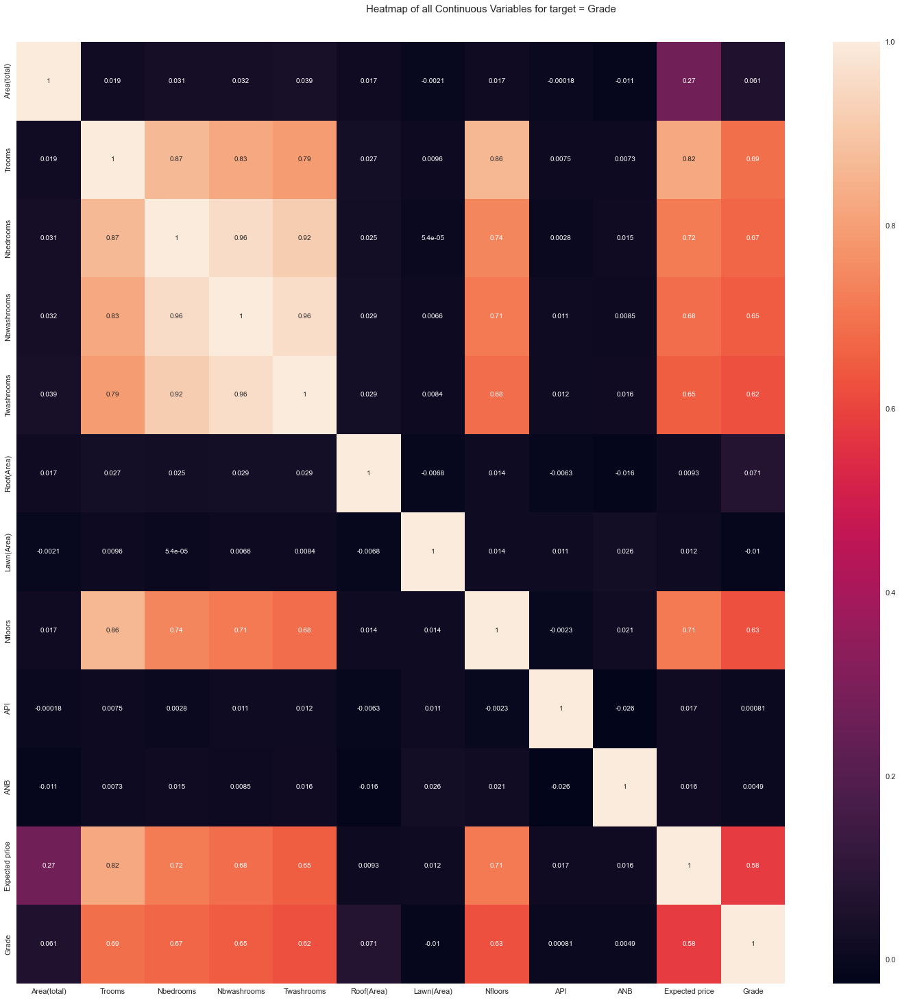

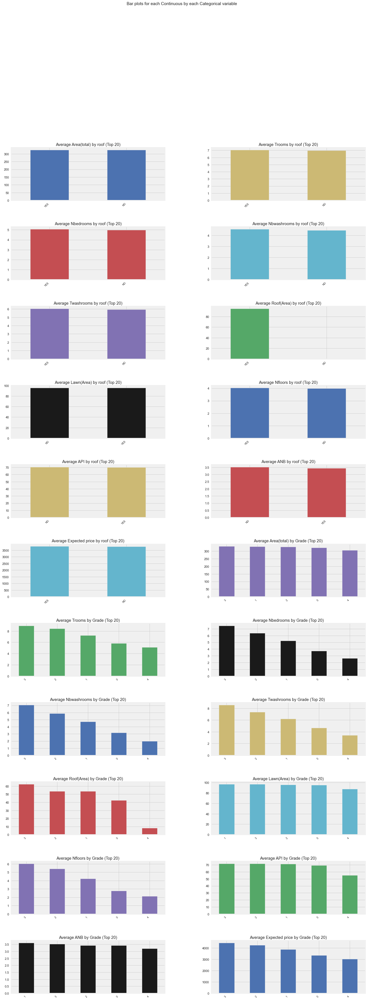

All Plots done
Time to run AutoViz = 32 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [41]:
df_av=AV.AutoViz("House Grade.csv",depVar='Grade')

In [42]:
cat_df=df.select_dtypes(include='object')
cat_df.columns

Index(['roof', 'Grade'], dtype='object')

In [43]:
from sklearn.preprocessing import LabelEncoder

In [44]:
le=LabelEncoder()
for i in cat_df:
    df[i]=df[i].astype("category")
    df[i]=le.fit_transform(df[i])

In [45]:
df

,Area(total),Trooms,Nbedrooms,Nbwashrooms,Twashrooms,roof,Roof(Area),Lawn(Area),Nfloors,API,ANB,Expected price,Grade
0,339,6,5,4,6,0,0,76,2,79,6,3481,3
1,358,5,4,3,4,1,71,96,3,72,4,3510,3
2,324,7,5,4,5,1,101,117,5,64,3,3748,2
3,330,6,4,3,5,1,101,82,2,59,2,3134,3
4,320,7,4,4,5,0,0,75,3,40,1,3843,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,341,9,6,5,7,1,95,115,5,90,2,4246,1
2996,292,9,8,7,8,1,116,87,7,97,4,3753,0
2997,328,7,4,3,5,0,0,78,5,95,6,3607,3
2998,293,9,7,7,8,0,0,78,7,51,3,4198,1


In [46]:
from sklearn.preprocessing import StandardScaler

In [47]:
df1=df.drop("Grade",axis='columns')

In [48]:
scaler=StandardScaler()
scaled_df=pd.DataFrame(scaler.fit_transform(df1),columns=df1.columns)

In [49]:
scaled_df

,Area(total),Trooms,Nbedrooms,Nbwashrooms,Twashrooms,roof,Roof(Area),Lawn(Area),Nfloors,API,ANB,Expected price
0,0.677077,-0.718985,-0.014071,-0.299518,-0.005973,-1.029090,-1.004968,-1.321837,-1.241831,0.501655,1.488214,-0.532429
1,1.603710,-1.422722,-0.625854,-0.882616,-1.125895,0.971733,0.451785,0.026334,-0.625028,0.103034,0.307560,-0.481292
2,-0.054476,-0.015248,-0.014071,-0.299518,-0.565934,0.971733,1.067315,1.441914,0.608580,-0.352533,-0.282766,-0.061609
3,0.238145,-0.718985,-0.625854,-0.882616,-0.565934,0.971733,1.067315,-0.917385,-1.241831,-0.637262,-0.873093,-1.144319
4,-0.249557,-0.015248,-0.625854,-0.299518,-0.565934,-1.029090,-1.004968,-1.389245,-0.625028,-1.719234,-1.463420,0.105911
...,...,...,...,...,...,...,...,...,...,...,...,...
2995,0.774617,1.392227,0.597712,0.283580,0.553988,0.971733,0.944209,1.307097,0.608580,1.128060,-0.873093,0.816550
2996,-1.615123,1.392227,1.821279,1.449776,1.113949,0.971733,1.375079,-0.580343,1.842187,1.526681,0.307560,-0.052792
2997,0.140604,-0.015248,-0.625854,-0.882616,-0.565934,-1.029090,-1.004968,-1.187019,0.608580,1.412789,1.488214,-0.310245
2998,-1.566353,1.392227,1.209496,1.449776,1.113949,-1.029090,-1.004968,-1.187019,1.842187,-1.092829,-0.282766,0.731908


In [50]:
x=scaled_df
y=df.Grade

In [51]:
from sklearn.model_selection import train_test_split

In [52]:
# splitting
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

# Decision Tree Classifier

In [53]:
from sklearn.tree import DecisionTreeClassifier

In [54]:
dtc=DecisionTreeClassifier(max_depth=3)
dtc.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=3)

In [55]:
dtc_R2=dtc.score(x_train,y_train)
dtc_R2

0.755

In [56]:
dtc_pred=dtc.predict(x_test)

In [57]:
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score

In [58]:
dtc_accuracy_score=accuracy_score(y_test,dtc_pred)
dtc_f1_score=f1_score(y_test,dtc_pred,average='weighted')
dtc_recall_score=recall_score(y_test,dtc_pred,average='weighted')
dtc_precision_score=precision_score(y_test,dtc_pred,average='weighted')

In [59]:
from sklearn.metrics import confusion_matrix

In [60]:
confusion_matrix(y_test,dtc_pred)

array([[ 53,  34,   0,   0,   0],
       [  1,  96,   8,   1,   0],
       [  0,  26,  62,  37,   0],
       [  0,   0,  14, 258,   0],
       [  0,   0,   0,  10,   0]], dtype=int64)

In [61]:
from sklearn import tree

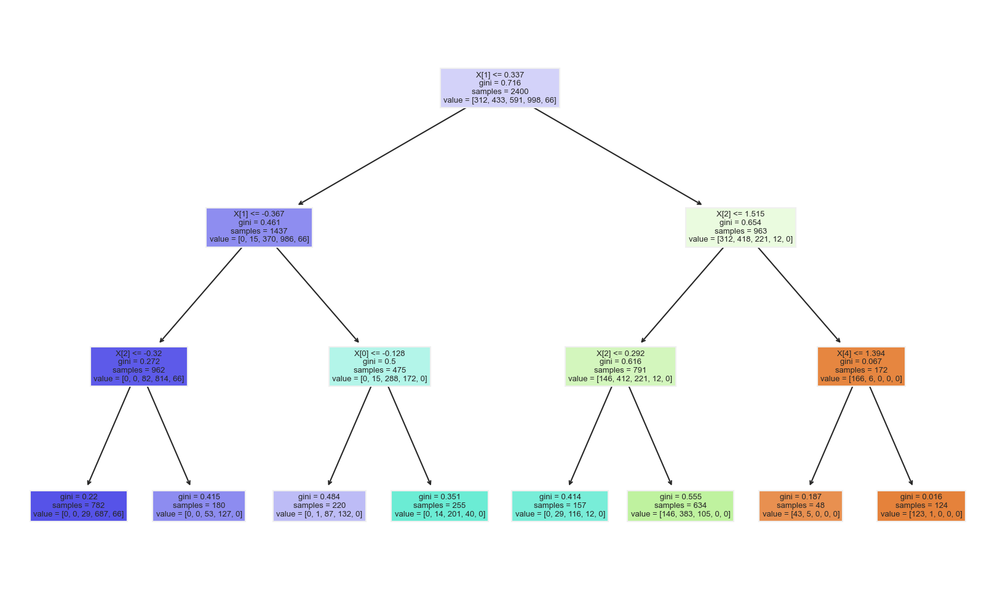

In [62]:
fig,ax=plt.subplots(dpi=300)
tree.plot_tree(dtc,filled=True)
plt.show()

In [63]:
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score

In [64]:
skf=StratifiedKFold(n_splits=4)

In [65]:
dtc_cv=cross_val_score(dtc,x_train,y_train,cv=skf,scoring='accuracy').mean()
print("CV of DTC:",dtc_cv)

CV of DTC: 0.7529166666666667


# Naive Bayes Classifier

In [66]:
from sklearn.naive_bayes import GaussianNB

In [67]:
gnb=GaussianNB()
gnb.fit(x_train,y_train)

GaussianNB()

In [68]:
gnb_R2=gnb.score(x_train,y_train)

In [69]:
gnb_pred=gnb.predict(x_test)

In [70]:
# checking model performance
gnb_accuracy_score=accuracy_score(y_test,gnb_pred)
gnb_f1_score=f1_score(y_test,gnb_pred,average='weighted')
gnb_recall_score=recall_score(y_test,gnb_pred,average='weighted')
gnb_precision_score=precision_score(y_test,gnb_pred,average='weighted')

In [71]:
gnb_cv=cross_val_score(gnb,x_train,y_train,cv=skf,scoring='accuracy').mean()
print("CV of GNB:",gnb_cv)

CV of GNB: 0.7970833333333334


# KNN Classifier

In [72]:
from sklearn.neighbors import KNeighborsClassifier

In [73]:
knc=KNeighborsClassifier()
knc.fit(x_train,y_train)

KNeighborsClassifier()

In [74]:
knc_R2=knc.score(x_train,y_train)

In [75]:
knc_pred=knc.predict(x_test)

In [76]:
# checking model performance
knc_accuracy_score=accuracy_score(y_test,knc_pred)
knc_f1_score=f1_score(y_test,knc_pred,average='weighted')
knc_recall_score=recall_score(y_test,knc_pred,average='weighted')
knc_precision_score=precision_score(y_test,knc_pred,average='weighted')

In [77]:
knc_cv=cross_val_score(knc,x_train,y_train,cv=skf,scoring='accuracy').mean()
print("CV of KNC:",knc_cv)

CV of KNC: 0.84


In [78]:
Final_Values=pd.DataFrame({"Algorithms":["Decision Tree Classifier","GaussianNB","KNN Classifier"],"R2":[dtc_R2,gnb_R2,knc_R2],"Accuracy_Score":[dtc_accuracy_score,gnb_accuracy_score,knc_accuracy_score],"F1_Score":[dtc_f1_score,gnb_f1_score,knc_f1_score],"Recall_Score":[dtc_recall_score,gnb_recall_score,knc_recall_score],"Precision_Score":[dtc_precision_score,gnb_precision_score,knc_precision_score],"CV_Score":[dtc_cv,gnb_cv,knc_cv]})
Final_Values

,Algorithms,R2,Accuracy_Score,F1_Score,Recall_Score,Precision_Score,CV_Score
0,Decision Tree Classifier,0.755000,0.781667,0.766783,0.781667,0.787025,0.752917
1,GaussianNB,0.803750,0.813333,0.817908,0.813333,0.828323,0.797083
2,KNN Classifier,0.924167,0.890000,0.887597,0.890000,0.890204,0.840000


# Conclusion:
    - KNN Classifier is a better model because it gives us good valuescompared to other 2 models.